IMPORTS

In [1]:
from selenium import webdriver
from selenium.webdriver.chrome.service import Service
from webdriver_manager.chrome import ChromeDriverManager
from selenium import webdriver
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
from selenium.common.exceptions import TimeoutException
from bs4 import BeautifulSoup
from selenium import webdriver 

In [2]:
import pandas as pd
import numpy as np
import requests
from pprint import pprint
from bs4 import BeautifulSoup
import re
import json
from urllib.request import Request, urlopen
from lxml import html
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

In [3]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from pycaret.clustering import *


CRAWLER

In [4]:
#CONFIGURANDO SERVIÇO PARA WEBCRAWLER, USANDO O XPATH PARA COLETAR UM ELEMENTO, ASSIM FORÇANDO O SCRAPPING APÓS O CARREGAMENTO COMPLETO DA PÁGINA
service = Service(executable_path='C:/Users/Gustavo/Documents/FIAP/2TIAR/FRONT_END/CKP1/chromedriver.exe')

try:
    browser = webdriver.Chrome(service=service)
    browser.get("https://www.imdb.com/chart/top/?ref_=nv_mv_250")
    timeout_in_seconds = 10
    WebDriverWait(browser, 20).until(EC.presence_of_element_located((By.XPATH, '//*[@id="__next"]/main/div/div[3]/section/div/div[2]/div/ul')))
    html = browser.page_source
    soup = BeautifulSoup(html, features="html.parser")
    print(soup)

except TimeoutException:
    print("deu ruim")
finally:
    browser.quit()

<html class="scriptsOn" lang="pt-BR" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/"><head><script async="" crossorigin="anonymous" src="https://images-na.ssl-images-amazon.com/images/I/31bJewCvY-L.js"></script><meta charset="utf-8"/><meta content="width=device-width" name="viewport"/><script>if(typeof uet === 'function'){ uet('bb', 'LoadTitle', {wb: 1}); }</script><title>Os 250 melhores filmes do IMDb</title><meta content="Conforme avaliado pelos eleitores regulares do IMDb." data-id="main" name="description"/><meta content="IMDb" property="og:site_name"/><meta content="Os 250 melhores filmes do IMDb" property="og:title"/><meta content="Conforme avaliado pelos eleitores regulares do IMDb." property="og:description"/><meta content="website" property="og:type"/><meta content="https://m.media-amazon.com/images/G/01/imdb/images/social/imdb_logo.png" property="og:image"/><meta content="1000" property="og:image:height"/><meta content="1000" prope

In [5]:
#VERIFICANDO TODOS OS TITULOS (COMO MOSTRA APENAS ATÉ O 24, UTILIZO UM CONTADOR PARA SABER ATÉ QUE LINHA CHEGAMOS)
titles = soup.find_all('h3', attrs={'class':'ipc-title__text'})
i = 0
for t in titles:
    i = i + 1
    print(f'{t}+{i}')

<h3 class="ipc-title__text">Tabelas do IMDb</h3>+1
<h3 class="ipc-title__text">1. Um Sonho de Liberdade</h3>+2
<h3 class="ipc-title__text">2. O Poderoso Chefão</h3>+3
<h3 class="ipc-title__text">3. Batman: O Cavaleiro das Trevas</h3>+4
<h3 class="ipc-title__text">4. O Poderoso Chefão II</h3>+5
<h3 class="ipc-title__text">5. 12 Homens e uma Sentença</h3>+6
<h3 class="ipc-title__text">6. A Lista de Schindler</h3>+7
<h3 class="ipc-title__text">7. O Senhor dos Anéis: O Retorno do Rei</h3>+8
<h3 class="ipc-title__text">8. Pulp Fiction: Tempo de Violência</h3>+9
<h3 class="ipc-title__text">9. O Senhor dos Anéis: A Sociedade do Anel</h3>+10
<h3 class="ipc-title__text">10. Três Homens em Conflito</h3>+11
<h3 class="ipc-title__text">11. Forrest Gump: O Contador de Histórias</h3>+12
<h3 class="ipc-title__text">12. O Senhor dos Anéis: As Duas Torres</h3>+13
<h3 class="ipc-title__text">13. Clube da Luta</h3>+14
<h3 class="ipc-title__text">14. A Origem</h3>+15
<h3 class="ipc-title__text">15. Star W

In [6]:
#CRIANDO UMA LISTA COM OS TITULOS DE TODOS OS FILMES
list_title_en = []
for x in titles:
  if x.text != 'IMDb Charts' and x.text != 'Recently viewed':
    tit = (x.text).split('.')[-1].strip()
    list_title_en.append(tit)
print(len(list_title_en))
list_title_en

264


['Tabelas do IMDb',
 'Um Sonho de Liberdade',
 'O Poderoso Chefão',
 'Batman: O Cavaleiro das Trevas',
 'O Poderoso Chefão II',
 '12 Homens e uma Sentença',
 'A Lista de Schindler',
 'O Senhor dos Anéis: O Retorno do Rei',
 'Pulp Fiction: Tempo de Violência',
 'O Senhor dos Anéis: A Sociedade do Anel',
 'Três Homens em Conflito',
 'Forrest Gump: O Contador de Histórias',
 'O Senhor dos Anéis: As Duas Torres',
 'Clube da Luta',
 'A Origem',
 'Star Wars: Episódio V - O Império Contra-Ataca',
 'Matrix',
 'Os Bons Companheiros',
 'Um Estranho no Ninho',
 'Interestelar',
 'Seven: Os Sete Crimes Capitais',
 'A Felicidade Não se Compra',
 'Os Sete Samurais',
 'O Silêncio dos Inocentes',
 'O Resgate do Soldado Ryan',
 'Cidade de Deus',
 'A Vida é Bela',
 'À Espera de um Milagre',
 'O Exterminador do Futuro 2: O Julgamento Final',
 'Star Wars: Episódio IV - Uma Nova Esperança',
 'De Volta para o Futuro',
 'A Viagem de Chihiro',
 'O Pianista',
 'Parasita',
 'Psicose',
 'Gladiador',
 'O Rei Leão'

In [7]:
#CRIANDO UMA LISTA COM O ANO DE LANÇAMENTO DE TODOS OS FILMES
list_years = []
years = soup.find_all('div', attrs={'class':'sc-b189961a-7 btCcOY cli-title-metadata'})

for y in years:
  year = y.find('div', attrs={'class':'sc-b189961a-7 btCcOY cli-title-metadata'})
for year in years:
    # print(year.text)
  list_years.append(year.text[:4])
display(len(list_years))
list_years

250

['1994',
 '1972',
 '2008',
 '1974',
 '1957',
 '1993',
 '2003',
 '1994',
 '2001',
 '1966',
 '1994',
 '2002',
 '1999',
 '2010',
 '1980',
 '1999',
 '1990',
 '1975',
 '2014',
 '1995',
 '1946',
 '1954',
 '1991',
 '1998',
 '2002',
 '1997',
 '1999',
 '1991',
 '1977',
 '1985',
 '2001',
 '2002',
 '2019',
 '1960',
 '2000',
 '1994',
 '2023',
 '2006',
 '2014',
 '1998',
 '1994',
 '1988',
 '2006',
 '1962',
 '2024',
 '1995',
 '1942',
 '2011',
 '1988',
 '1936',
 '1979',
 '1954',
 '1968',
 '1931',
 '2012',
 '1979',
 '2000',
 '2008',
 '1981',
 '2023',
 '2006',
 '1950',
 '2018',
 '1957',
 '2018',
 '1957',
 '1980',
 '1940',
 '1986',
 '2009',
 '2012',
 '2017',
 '1984',
 '1964',
 '1995',
 '2003',
 '1999',
 '2019',
 '1995',
 '1981',
 '1997',
 '1997',
 '2019',
 '2016',
 '1963',
 '2009',
 '1984',
 '1952',
 '2018',
 '1985',
 '2000',
 '2010',
 '1983',
 '2004',
 '2012',
 '1968',
 '1952',
 '1992',
 '1962',
 '1960',
 '2010',
 '2023',
 '1959',
 '1983',
 '1941',
 '1944',
 '1931',
 '1958',
 '1987',
 '1995',
 '2001',
 

In [8]:
#CRIANDO UMA LISTA COM A CLASSIFICAÇÃO DE TODOS OS FILMES
list_rating = []

rating_span = soup.find_all('span', class_='ipc-rating-star--rating')
for x in rating_span:
  list_rating.append(x.text)
display(len(list_rating))
list_rating

250

['9,3',
 '9,2',
 '9,0',
 '9,0',
 '9,0',
 '9,0',
 '9,0',
 '8,9',
 '8,9',
 '8,8',
 '8,8',
 '8,8',
 '8,8',
 '8,8',
 '8,7',
 '8,7',
 '8,7',
 '8,7',
 '8,7',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,6',
 '8,5',
 '8,6',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,6',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,6',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,5',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,9',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,4',
 '8,3',
 '8,4',
 '8,3',
 '8,3',
 '8,4',
 '8,4',
 '8,4',
 '8,4',
 '8,3',
 '8,3',
 '8,4',
 '8,4',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,3',
 '8,2',
 '8,3',
 '8,3',
 '8,3',
 '8,2',
 '8,3',
 '8,3',
 '8,3',
 '8,2',
 '8,2',
 '8,3',
 '8,3',
 '8,2',
 '8,2',
 '8,2',
 '8,3',
 '8,3',


In [9]:
#CRIANDO UMA LISTA COM OS LINKS PARA COLETAR O GÊNERO POSTERIORMENTE

list_links = []
for a in soup.find_all('a', href=True):
  if '/title/' in a['href'] and 'https://www.imdb.com/'+a['href'] not in list_links:
    list_links.append(('https://www.imdb.com/'+a['href'])[:-15])

#JOGA FORA OS DUPLICADOS
list_links = list(dict.fromkeys(list_links))
list_links = list_links[1:]
display(len(list_links))
list_links[:5]

273

['https://www.imdb.com//title/tt0111161/',
 'https://www.imdb.com//title/tt0068646/',
 'https://www.imdb.com//title/tt0468569/',
 'https://www.imdb.com//title/tt0071562/',
 'https://www.imdb.com//title/tt0050083/']

In [10]:
headers = {
          'authority': 'www.amazon.com.br',
          'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
          'accept-language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
          'cache-control': 'max-age=0',
          'device-memory': '8',
          'downlink': '10',
          'dpr': '1.875',
          'ect': '4g',
          'rtt': '50',
          'sec-ch-device-memory': '8',
          'sec-ch-dpr': '1.875',
          'sec-ch-ua': '"Chromium";v="110", "Not A(Brand";v="24", "Google Chrome";v="110"',
          'sec-ch-ua-mobile': '?0',
          'sec-ch-ua-platform': '"Windows"',
          'sec-ch-ua-platform-version': '"10.0.0"',
          'sec-ch-viewport-width': '455',
          'sec-fetch-dest': 'document',
          'sec-fetch-mode': 'navigate',
          'sec-fetch-site': 'none',
          'sec-fetch-user': '?1',
          'upgrade-insecure-requests': '1',
          'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36',
          'viewport-width': '455',
          }
list_genre = []
list_title_pt = []
list_year = []
list_sinopse = []

for link in list_links:
  time.sleep(.5)
  response = requests.get(link, headers = headers)
  html = response.content
  soup = BeautifulSoup(html, "html.parser")

  #GÊNERO
  try:
    for genre in soup.find('span', {'class':'ipc-chip__text'}):
      genre = genre.text
      list_genre.append(genre)
  except:
      list_genre.append(np.nan)
      print('Nan')

  #TITULOS EM PORTUGUÊS E INGLES
  try:
    for x in soup.find('title'):
      title_pt = (x.text)[:-14].strip()
      list_title_pt.append(title_pt)

      year = (x.text)[-12:-8].strip()
      list_year.append(year)

  except:
    list_title_pt.append(np.nan)
    list_year.append(np.nan)

  #SINOPSE
  try:
    for sin in soup.find('span', {"data-testid":"plot-xl"}):
      sinopse = sin.text
      list_sinopse.append(sinopse)
  except:
    list_sinopse.append(np.nan)

  print(genre, title_pt, year, sinopse[:20])

display(len(list_genre), len(list_title_pt), len(list_year), len(list_sinopse))
print(list_genre[:5])
print(list_title_pt[:5])
print(list_year[:5])
display(list_sinopse[:2])

Epic Um Sonho de Liberdade 1994 Dois homens presos s
Epic O Poderoso Chefão 1972 O patriarca idoso de
Action Epic Batman: O Cavaleiro das Trevas 2008 Agora com a ajuda do
Epic O Poderoso Chefão II 1974 Em 1950, Michael Cor
Legal Drama 12 Homens e uma Sentença 1957 O julgamento de um a
Epic A Lista de Schindler 1993 Na Polônia ocupada p
Adventure Epic O Senhor dos Anéis: O Retorno do Rei 2003 Gandalf e Aragorn li
Dark Comedy Pulp Fiction: Tempo de Violência 1994 As vidas de dois ass
Adventure Epic O Senhor dos Anéis: A Sociedade do Anel 2001 Um manso hobbit do C
Desert Adventure Três Homens em Conflito 1966 Um impostor se junta
Epic Forrest Gump: O Contador de Histórias 1994 Os governos dos pres
Adventure Epic O Senhor dos Anéis: As Duas Torres 2002 Enquanto Frodo e Sam
Psychological Drama Clube da Luta 1999 Um trabalhador de es
Action Epic A Origem 2010 Um ladrão que rouba 
Action Epic Star Wars: Episódio V - O Império Contra-Ataca 1980 Depois que a Aliança
Action Epic Matrix 1999 Um h

ChunkedEncodingError: Response ended prematurely

In [ ]:
list_genre

['Epic',
 'Epic',
 'Action Epic',
 'Epic',
 'Legal Drama',
 'Epic',
 'Adventure Epic',
 'Dark Comedy',
 'Adventure Epic',
 'Desert Adventure',
 'Epic',
 'Adventure Epic',
 'Psychological Drama',
 'Action Epic',
 'Action Epic',
 'Action Epic',
 'Dark Comedy',
 'Medical Drama',
 'Adventure Epic',
 'Cop Drama',
 'Feel-Good Romance',
 'Action Epic',
 'Police Procedural',
 'Epic',
 'Coming-of-Age',
 'Period Drama',
 'Period Drama',
 'Action Epic',
 'Action Epic',
 'Car Action',
 'Anime',
 'Docudrama',
 'Dark Comedy',
 'Psychological Horror',
 'Action Epic',
 'Animal Adventure',
 'Computer Animation',
 'Cop Drama',
 'Psychological Drama',
 'Prison Drama',
 'Gangster',
 'Adult Animation',
 'Period Drama',
 'Period Drama',
 'Action Epic',
 'Gangster',
 'Drama',
 'Docudrama',
 'Coming-of-Age',
 'Slapstick',
 'Cyberpunk',
 'Suspense Mystery',
 'Desert Adventure',
 'Feel-Good Romance',
 'Dark Comedy',
 'Adventure Epic',
 'Psychological Thriller',
 'Adventure Epic',
 'Adventure Epic',
 'Docudrama'

SALVAR BASE DE DADOS

In [ ]:
#COMO "RASPAMOS" RESIDUO DURANTE O SCRAPPING, FAÇO UM CORTE PELO NÚMERO DO MENOR LENGTH POIS ASSIM TEMOS CERTEZA DE QUE APENAS TEMOS AS INFORMAÇÕES DOS FILMES

min_length = min(len(list_title_pt), len(list_title_en), len(list_years), len(list_rating), len(list_genre), len(list_sinopse))
list_title_pt = list_title_pt[:min_length]
list_title_en = list_title_en[:min_length]
list_years = list_years[:min_length]
list_rating = list_rating[:min_length]
list_genre = list_genre[:min_length]
list_sinopse = list_sinopse[:min_length]

In [ ]:
#AVALIANDO O TAMANHO DAS LISTAS, QUALQUER RESPOSTA DIFERENTE DE 250 ESTÁ ERRADA

print(len(list_title_pt))
print(len(list_title_en))
print(len(list_years))
print(len(list_rating))
print(len(list_genre))
print(len(list_sinopse))

250
250
250
250
250
250


In [ ]:
#CRIAMOS UM DATAFRAME COM AS INFORMAÇÕES DOS FILMES

df = pd.DataFrame({'title_pt':list_title_pt,
                   'title_en':list_title_en,
                   'year':list_years,
                   'rating':list_rating,
                   'genre':list_genre,
                   'sinopse':list_sinopse})
display(df.tail(50))

,title_pt,title_en,year,rating,genre,sinopse
200,Bancando o Águia,Tubarão,1924,"8,2",Bumbling Detective,Um projecionista de cinema deseja ser um detet...
201,Como Treinar o Seu Dragão,Bancando o Águia,2010,"8,1",Computer Animation,Um jovem e desafortunado viking que aspira a c...
202,Ratatouille,Como Treinar o Seu Dragão,2007,"8,1",Animal Adventure,Um rato que pode cozinhar forja uma aliança in...
203,Sindicato de Ladrões,Ratatouille,1954,"8,1",Crime,"Um ex-pugilista de Nova Jersey, agora um operá..."
204,Mary e Max - Uma Amizade Diferente,Sindicato de Ladrões,2009,"8,1",Adult Animation,Relata a estranha história de uma amizade entr...
205,O Salário do Medo,Mary e Max - Uma Amizade Diferente,1953,"8,1",Psychological Drama,"Em uma aldeia da América do Sul, quatro homens..."
206,O 3º Homem,O Salário do Medo,1949,"8,1",Film Noir,"O romancista Holly Martins viaja para sombria,..."
207,Morangos Silvestres,O 3º Homem,1957,"8,1",Psychological Drama,"Depois de viver uma vida marcada pela frieza, ..."
208,Ford vs. Ferrari,Morangos Silvestres,2019,"8,1",Docudrama,Um designer de carros e um motorista combatem ...
209,A Mulher Faz o Homem,Ferrari,1939,"8,1",Political Drama,Um homem ingênuo é eleito para ocupar uma vaga...


In [ ]:
#CONCATENAR COM ARQUIVO DE FILMES DISPONIBILIZADO PELO PROFESSOR

df_historico = pd.read_csv('C:/Users/Gustavo/Documents/FIAP/2TIAR/FRONT_END/CKP1/all_movies.csv', sep = ';')
df = pd.concat([df_historico, df])
df.drop_duplicates(inplace = True)
df.reset_index(drop = True, inplace = True)
df.tail()

,title_pt,title_en,year,rating,genre,sinopse
495,Rebeldia Indomável,Histórias Cruzadas,1967,"8,1",Prison Drama,Um sulista quieto é condenado a dois anos em u...
496,Aconteceu Naquela Noite,Rebeldia Indomável,1934,"8,1",Road Trip,Uma herdeira mimada que foge de sua família é ...
497,"Paris, Texas",Aconteceu Naquela Noite,1984,"8,1",Road Trip,Travis Henderson retorna à vida em sociedade a...
498,Troca Surpresa,"Paris, Texas",2023,"8,4",Comedy,Trocadas por acidente enquanto viajavam até a ...
499,Aladdin,Troca Surpresa,1992,"8,0",Desert Adventure,Um menino de rua bondoso e um Vizir competem p...


ANALISE EXPLORATORIA

In [ ]:
df.sort_values('genre', inplace = True)
print(df.shape)
df.head()

(500, 6)


,title_pt,title_en,year,rating,genre,sinopse
377,Dangal,A Queda! As Últimas Horas de Hitler,2016,"8,3",Action,O lutador Mahavir e suas filhas lutadoras proc...
441,Maharaja,Sociedade dos Poetas Mortos,2024,"8,6",Action,Um barbeiro busca vingança depois que sua casa...
294,Duna: Parte 2,Harakiri,2024,"8,5",Action Epic,Diante da difícil escolha entre o amor de sua ...
263,A Origem,Clube da Luta,2010,"8,8",Action Epic,Um ladrão que rouba segredos corporativos atra...
331,Princesa Mononoke,Gênio Indomável,1997,"8,3",Action Epic,Um príncipe sofre com uma maldição mortal e pa...


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 377 to 479
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   title_pt  500 non-null    object
 1   title_en  500 non-null    object
 2   year      500 non-null    object
 3   rating    500 non-null    object
 4   genre     500 non-null    object
 5   sinopse   500 non-null    object
dtypes: object(6)
memory usage: 27.3+ KB


In [ ]:
df['rating'] = df['rating'].str.replace(',', '.').astype('float64')

In [ ]:
# Adjusting variable types
df['year'] = df['year'].astype('int64')
df['rating'] = df['rating'].astype('float64')

In [ ]:
df.describe()

,year,rating
count,500.000000,250.000000
mean,1987.158000,8.310000
std,25.511227,0.235461
min,1921.000000,8.000000
25%,1967.000000,8.100000
50%,1995.000000,8.200000
75%,2007.000000,8.400000
max,2024.000000,9.300000


In [ ]:
fig = px.bar(df.genre.value_counts('d')*100,
             text_auto=True,
             title = f'% de Filmes por Gênero',
             labels={'index':'Gênero',
                     'value':f'% de Filmes'})
fig.show()

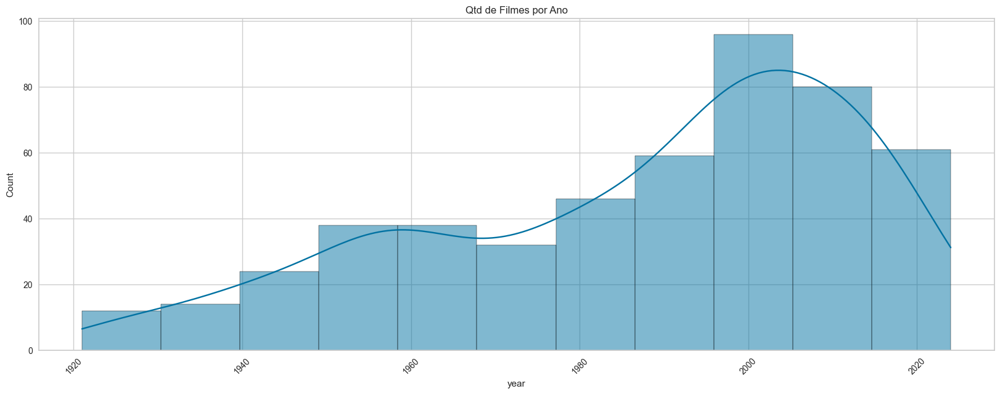

In [ ]:
plt.figure(figsize = (20,7))
sns.histplot( df,
              x = 'year',
              kde = True).set_title('Qtd de Filmes por Ano')
plt.xticks(rotation=45)
plt.show()

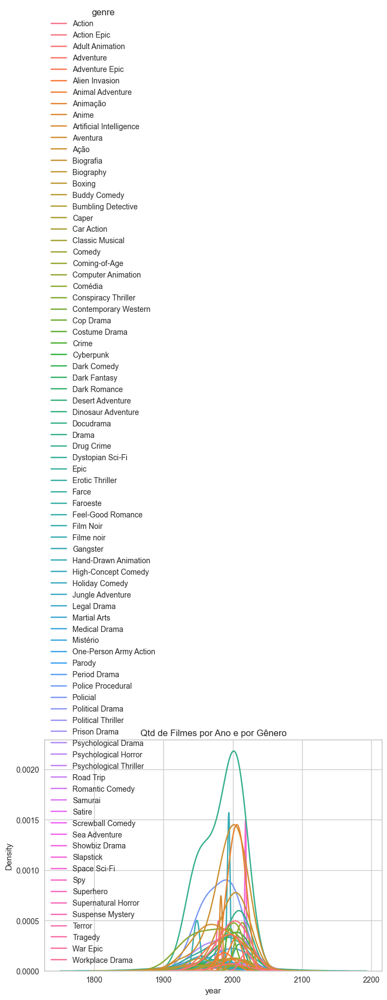

In [ ]:
sns.kdeplot( df, x = 'year', hue = 'genre', bw_adjust = 1.5, warn_singular = False).set_title('Qtd de Filmes por Ano e por Gênero')
plt.show()

In [ ]:
#convert sinopses to lowercase
df_processed = df.copy()
df_processed['sinopse'] = df_processed['sinopse'].str.lower()
df_processed['sinopse'].head()

377    o lutador mahavir e suas filhas lutadoras proc...
441    um barbeiro busca vingança depois que sua casa...
294    diante da difícil escolha entre o amor de sua ...
263    um ladrão que rouba segredos corporativos atra...
331    um príncipe sofre com uma maldição mortal e pa...
Name: sinopse, dtype: object

In [ ]:
def qty_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

In [ ]:
df_processed['word_count'] = df_processed['sinopse'].apply(qty_words).astype('int64')
df_processed.head()

,title_pt,title_en,year,rating,genre,sinopse,word_count
377,Dangal,A Queda! As Últimas Horas de Hitler,2016,8.3,Action,o lutador mahavir e suas filhas lutadoras proc...,18
441,Maharaja,Sociedade dos Poetas Mortos,2024,8.6,Action,um barbeiro busca vingança depois que sua casa...,37
294,Duna: Parte 2,Harakiri,2024,8.5,Action Epic,diante da difícil escolha entre o amor de sua ...,40
263,A Origem,Clube da Luta,2010,8.8,Action Epic,um ladrão que rouba segredos corporativos atra...,29
331,Princesa Mononoke,Gênio Indomável,1997,8.3,Action Epic,um príncipe sofre com uma maldição mortal e pa...,30


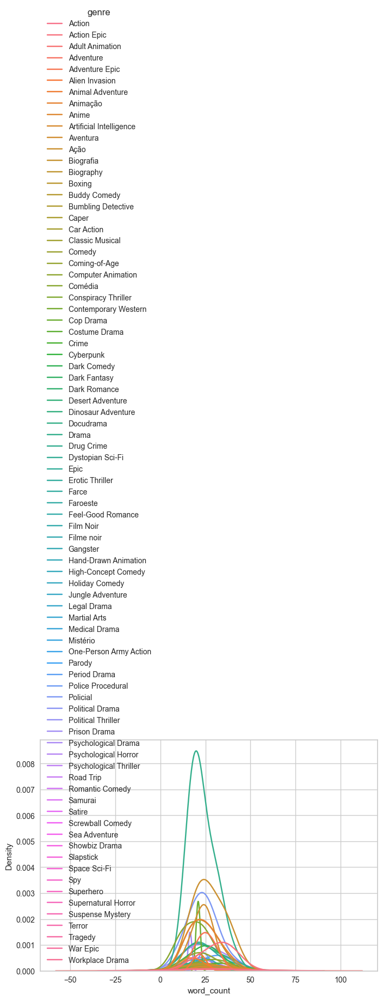

In [ ]:
sns.kdeplot( df_processed, x = 'word_count', hue = 'genre', bw_adjust = 1.5, warn_singular = False)
plt.show()

PROCESSAMENTO DE TEXTO

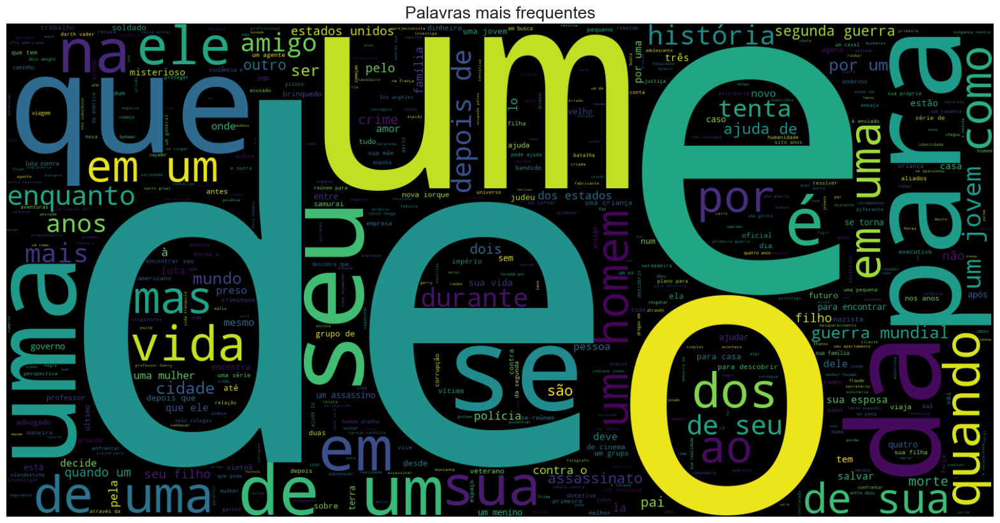

In [ ]:
text = ' '.join([phrase for phrase in df_processed['sinopse']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes', fontsize = 19)
plt.show()

In [ ]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('portuguese')
print(stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Gustavo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


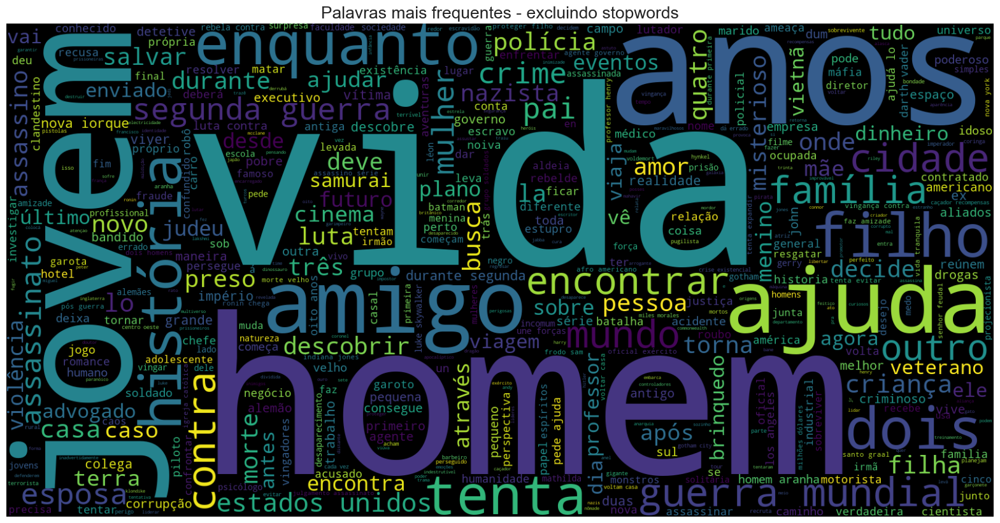

In [ ]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
text = ' '.join([phrase for phrase in df_processed['sinopse_no_stopwords']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes - excluindo stopwords', fontsize = 19)
plt.show()

MODELO 1

In [ ]:
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(df_processed['sinopse_no_stopwords'])

In [ ]:
print(X.shape)
X.toarray()

(500, 250)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [ ]:
s = setup(data = X.toarray(),
          session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(500, 250)"
2,Transformed data shape,"(500, 250)"
3,Numeric features,250
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


In [ ]:
s = setup(data = X.toarray(),
          session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(500, 250)"
2,Transformed data shape,"(500, 250)"
3,Numeric features,250
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,False


In [ ]:
mdl_kmeans = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.0143,5.2429,6.0217,0,0,0


In [ ]:
mdl_dbscan = create_model('dbscan')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0,0,0,0,0,0


In [ ]:
df_kmeans = assign_model(mdl_kmeans)
display(df_kmeans.Cluster.value_counts())
df_kmeans

Cluster
Cluster 0    335
Cluster 2     56
Cluster 3     55
Cluster 1     54
Name: count, dtype: int64

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,...,feature_242,feature_243,feature_244,feature_245,feature_246,feature_247,feature_248,feature_249,feature_250,Cluster
0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
1,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.420447,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 2
2,0.000000,0.0,0.0,0.0,0.334139,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
3,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
4,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,0.378367,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
496,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 1
497,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
498,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3


In [ ]:
df_db = assign_model(mdl_dbscan)
df_db.Cluster.value_counts()

Cluster
Cluster -1    500
Name: count, dtype: int64

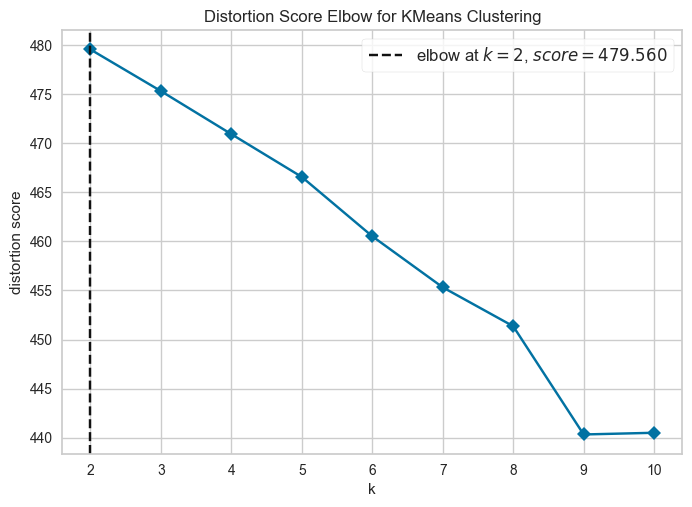

In [ ]:
plot_model(mdl_kmeans, plot = 'elbow')

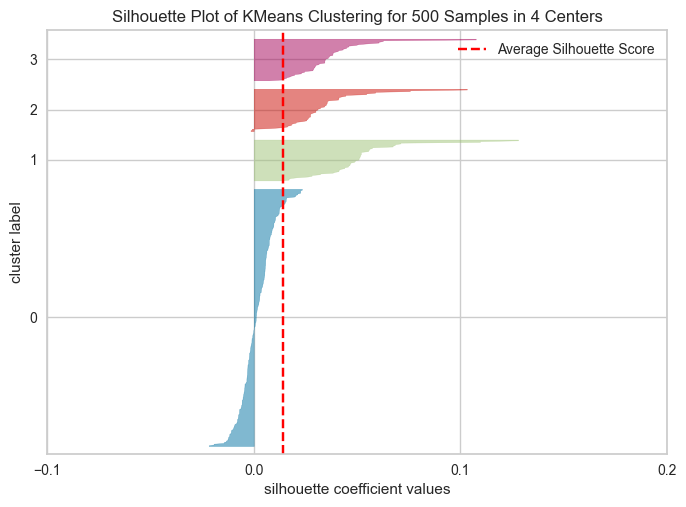

In [ ]:
plot_model(mdl_kmeans, plot = 'silhouette')

In [ ]:
plot_model(mdl_kmeans, plot = 'distribution')

In [ ]:
plot_model(mdl_kmeans, plot = 'cluster')

In [ ]:
plot_model(mdl_kmeans, plot = 'tsne')

In [ ]:
evaluate_model(mdl_kmeans)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
df_processed['cluster'] = df_kmeans['Cluster']
df_processed

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
377,Dangal,A Queda! As Últimas Horas de Hitler,2016,8.3,Action,o lutador mahavir e suas filhas lutadoras proc...,18,lutador mahavir filhas lutadoras procuram glor...,Cluster 0
441,Maharaja,Sociedade dos Poetas Mortos,2024,8.6,Action,um barbeiro busca vingança depois que sua casa...,37,"barbeiro busca vingança casa assaltada, dizend...",Cluster 0
294,Duna: Parte 2,Harakiri,2024,8.5,Action Epic,diante da difícil escolha entre o amor de sua ...,40,diante difícil escolha amor vida destino unive...,Cluster 0
263,A Origem,Clube da Luta,2010,8.8,Action Epic,um ladrão que rouba segredos corporativos atra...,29,ladrão rouba segredos corporativos através tec...,Cluster 0
331,Princesa Mononoke,Gênio Indomável,1997,8.3,Action Epic,um príncipe sofre com uma maldição mortal e pa...,30,príncipe sofre maldição mortal parte busca cur...,Cluster 0
...,...,...,...,...,...,...,...,...,...
492,Amores Brutos,O Gigante de Ferro,2000,8.0,Tragedy,um terrível acidente de carro conecta três his...,30,terrível acidente carro conecta três histórias...,Cluster 0
373,Ladrões de Bicicletas,Los Angeles: Cidade Proibida,1948,8.3,Tragedy,na itália da pós-guerra a bicicleta de um home...,21,itália pós-guerra bicicleta homem classe traba...,Cluster 0
447,O Franco Atirador,Relatos Selvagens,1978,8.1,War Epic,um retrato detalhado das maneiras pelas quais ...,23,retrato detalhado maneiras quais guerra vietnã...,Cluster 3
329,O Barco: Inferno no Mar,Coração Valente,1981,8.4,War Epic,o mundo claustrofóbico de um submarino da segu...,16,mundo claustrofóbico submarino segunda guerra ...,Cluster 0


In [ ]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

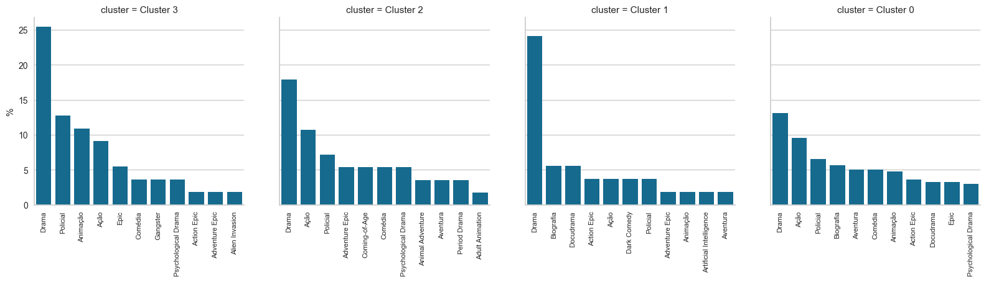

In [ ]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

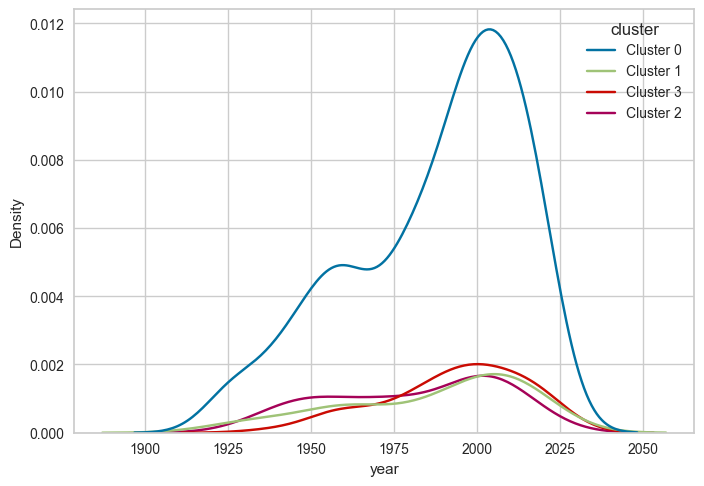

In [ ]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

In [ ]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,Cluster 0,Cluster 1,Cluster 2,Cluster 3
0,Action Epic,3.582090,3.703704,0.000000,1.818182
1,Adult Animation,0.000000,0.000000,1.785714,0.000000
2,Adventure Epic,0.000000,1.851852,5.357143,1.818182
3,Alien Invasion,0.000000,0.000000,0.000000,1.818182
4,Animal Adventure,0.000000,0.000000,3.571429,0.000000
5,Animação,4.776119,1.851852,0.000000,10.909091
6,Artificial Intelligence,0.000000,1.851852,0.000000,0.000000
7,Aventura,5.074627,1.851852,3.571429,0.000000
8,Ação,9.552239,3.703704,10.714286,9.090909
9,Biografia,5.671642,5.555556,0.000000,0.000000


In [ ]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Action Epic,Cluster 0,3.58209
1,Adult Animation,Cluster 0,0.00000
2,Adventure Epic,Cluster 0,0.00000
3,Alien Invasion,Cluster 0,0.00000
4,Animal Adventure,Cluster 0,0.00000


In [ ]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

Cluster 0


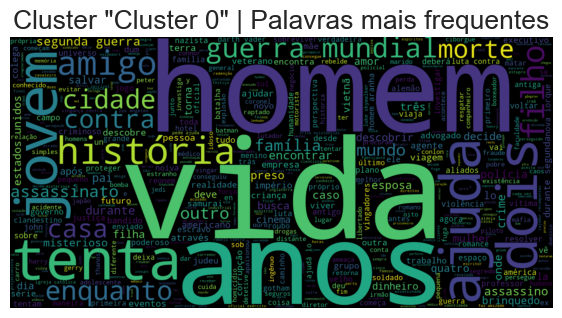

Cluster 1


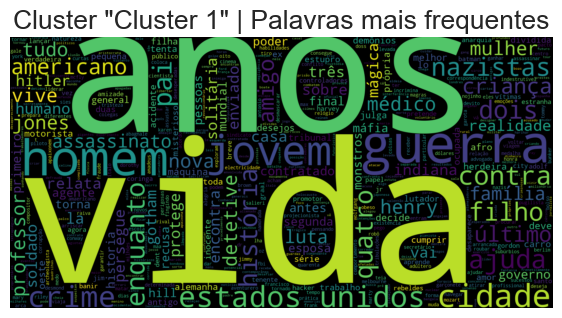

Cluster 3


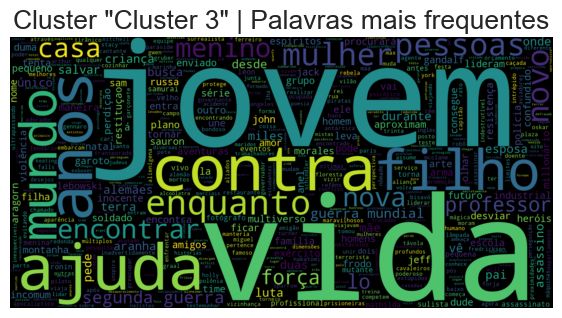

Cluster 2


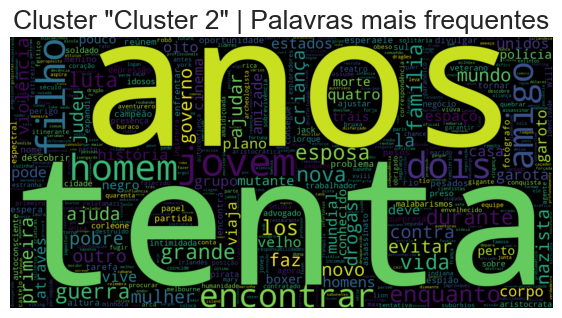

In [ ]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

list_clusters = df_processed.cluster.unique().tolist()
for c in list_clusters:
  print(c)
  word_cloud_cluster(c)

MODELO 2

In [ ]:
pd.DataFrame(X.toarray()).shape

(500, 250)

In [ ]:
df_processed.shape

(500, 9)

In [ ]:
df_all_no_year = pd.concat([
                    df_processed.drop(['cluster','year'], axis = 1),
                    pd.DataFrame(X.toarray())
                   ]
                   , axis = 1
                   )
df_all_no_year

,title_pt,title_en,rating,genre,sinopse,word_count,sinopse_no_stopwords,0,1,2,...,240,241,242,243,244,245,246,247,248,249
377,Dangal,A Queda! As Últimas Horas de Hitler,8.3,Action,o lutador mahavir e suas filhas lutadoras proc...,18,lutador mahavir filhas lutadoras procuram glor...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
441,Maharaja,Sociedade dos Poetas Mortos,8.6,Action,um barbeiro busca vingança depois que sua casa...,37,"barbeiro busca vingança casa assaltada, dizend...",0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
294,Duna: Parte 2,Harakiri,8.5,Action Epic,diante da difícil escolha entre o amor de sua ...,40,diante difícil escolha amor vida destino unive...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
263,A Origem,Clube da Luta,8.8,Action Epic,um ladrão que rouba segredos corporativos atra...,29,ladrão rouba segredos corporativos através tec...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
331,Princesa Mononoke,Gênio Indomável,8.3,Action Epic,um príncipe sofre com uma maldição mortal e pa...,30,príncipe sofre maldição mortal parte busca cur...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,Amores Brutos,O Gigante de Ferro,8.0,Tragedy,um terrível acidente de carro conecta três his...,30,terrível acidente carro conecta três histórias...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
373,Ladrões de Bicicletas,Los Angeles: Cidade Proibida,8.3,Tragedy,na itália da pós-guerra a bicicleta de um home...,21,itália pós-guerra bicicleta homem classe traba...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
447,O Franco Atirador,Relatos Selvagens,8.1,War Epic,um retrato detalhado das maneiras pelas quais ...,23,retrato detalhado maneiras quais guerra vietnã...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
329,O Barco: Inferno no Mar,Coração Valente,8.4,War Epic,o mundo claustrofóbico de um submarino da segu...,16,mundo claustrofóbico submarino segunda guerra ...,0.378367,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
s = setup(data = df_all_no_year,
          session_id = 123)

,Description,Value
0,Session id,123
1,Original data shape,"(500, 257)"
2,Transformed data shape,"(500, 1675)"
3,Numeric features,252
4,Categorical features,5
5,Rows with missing values,50.0%
6,Preprocess,True
7,Imputation type,simple
8,Numeric imputation,mean
9,Categorical imputation,mode


In [ ]:
mdl_kmeans_all_no_year = create_model('kmeans')

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.3634,816.2671,0.8623,0,0,0


In [ ]:
df_kmeans_all_no_year = assign_model(mdl_kmeans_all_no_year)
display(df_kmeans_all_no_year.Cluster.value_counts())
df_kmeans_all_no_year

Cluster
Cluster 0    186
Cluster 3    127
Cluster 2    122
Cluster 1     65
Name: count, dtype: int64

,title_pt,title_en,rating,genre,sinopse,word_count,sinopse_no_stopwords,0,1,2,...,241,242,243,244,245,246,247,248,249,Cluster
377,Dangal,A Queda! As Últimas Horas de Hitler,8.3,Action,o lutador mahavir e suas filhas lutadoras proc...,18,lutador mahavir filhas lutadoras procuram glor...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 2
441,Maharaja,Sociedade dos Poetas Mortos,8.6,Action,um barbeiro busca vingança depois que sua casa...,37,"barbeiro busca vingança casa assaltada, dizend...",0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 1
294,Duna: Parte 2,Harakiri,8.5,Action Epic,diante da difícil escolha entre o amor de sua ...,40,diante difícil escolha amor vida destino unive...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 1
263,A Origem,Clube da Luta,8.8,Action Epic,um ladrão que rouba segredos corporativos atra...,29,ladrão rouba segredos corporativos através tec...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
331,Princesa Mononoke,Gênio Indomável,8.3,Action Epic,um príncipe sofre com uma maldição mortal e pa...,30,príncipe sofre maldição mortal parte busca cur...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
492,Amores Brutos,O Gigante de Ferro,8.0,Tragedy,um terrível acidente de carro conecta três his...,30,terrível acidente carro conecta três histórias...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 3
373,Ladrões de Bicicletas,Los Angeles: Cidade Proibida,8.3,Tragedy,na itália da pós-guerra a bicicleta de um home...,21,itália pós-guerra bicicleta homem classe traba...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
447,O Franco Atirador,Relatos Selvagens,8.1,War Epic,um retrato detalhado das maneiras pelas quais ...,23,retrato detalhado maneiras quais guerra vietnã...,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 0
329,O Barco: Inferno no Mar,Coração Valente,8.4,War Epic,o mundo claustrofóbico de um submarino da segu...,16,mundo claustrofóbico submarino segunda guerra ...,0.378367,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cluster 2


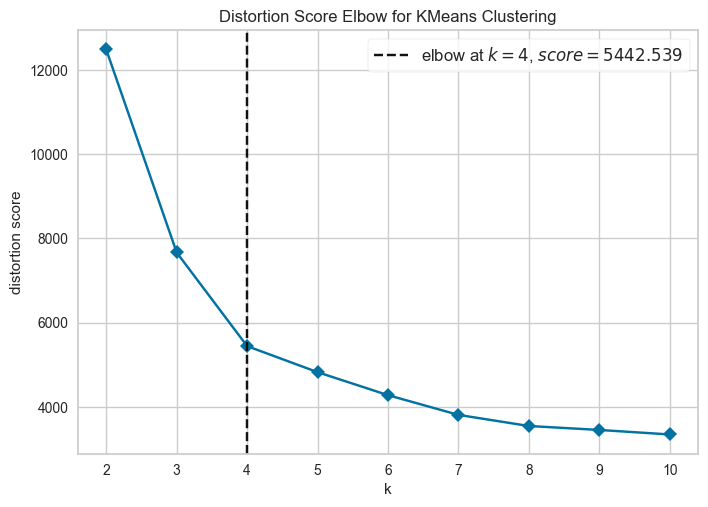

In [ ]:
plot_model(mdl_kmeans_all_no_year, plot = 'elbow')

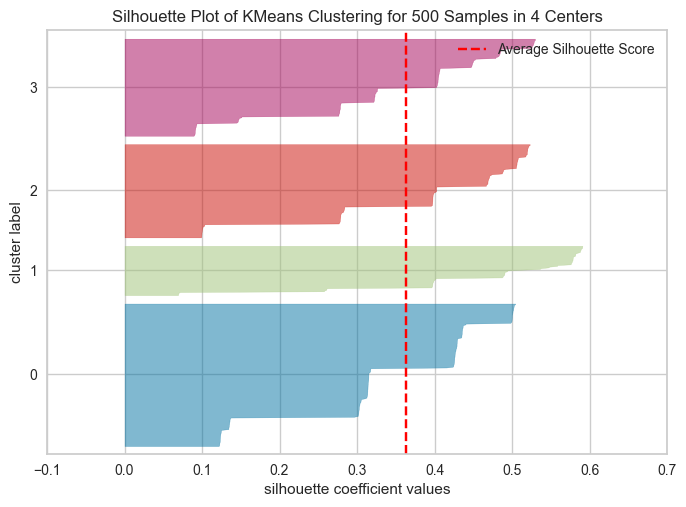

In [ ]:
plot_model(mdl_kmeans_all_no_year, plot = 'silhouette')

In [ ]:
plot_model(mdl_kmeans_all_no_year, plot = 'distribution')

In [ ]:
plot_model(mdl_kmeans_all_no_year, plot = 'cluster')

In [ ]:
plot_model(mdl_kmeans_all_no_year, plot = 'tsne')

In [ ]:
evaluate_model(mdl_kmeans_all_no_year)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
df_processed['cluster'] = df_kmeans_all_no_year['Cluster']
df_processed

,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
377,Dangal,A Queda! As Últimas Horas de Hitler,2016,8.3,Action,o lutador mahavir e suas filhas lutadoras proc...,18,lutador mahavir filhas lutadoras procuram glor...,Cluster 2
441,Maharaja,Sociedade dos Poetas Mortos,2024,8.6,Action,um barbeiro busca vingança depois que sua casa...,37,"barbeiro busca vingança casa assaltada, dizend...",Cluster 1
294,Duna: Parte 2,Harakiri,2024,8.5,Action Epic,diante da difícil escolha entre o amor de sua ...,40,diante difícil escolha amor vida destino unive...,Cluster 1
263,A Origem,Clube da Luta,2010,8.8,Action Epic,um ladrão que rouba segredos corporativos atra...,29,ladrão rouba segredos corporativos através tec...,Cluster 3
331,Princesa Mononoke,Gênio Indomável,1997,8.3,Action Epic,um príncipe sofre com uma maldição mortal e pa...,30,príncipe sofre maldição mortal parte busca cur...,Cluster 3
...,...,...,...,...,...,...,...,...,...
492,Amores Brutos,O Gigante de Ferro,2000,8.0,Tragedy,um terrível acidente de carro conecta três his...,30,terrível acidente carro conecta três histórias...,Cluster 3
373,Ladrões de Bicicletas,Los Angeles: Cidade Proibida,1948,8.3,Tragedy,na itália da pós-guerra a bicicleta de um home...,21,itália pós-guerra bicicleta homem classe traba...,Cluster 0
447,O Franco Atirador,Relatos Selvagens,1978,8.1,War Epic,um retrato detalhado das maneiras pelas quais ...,23,retrato detalhado maneiras quais guerra vietnã...,Cluster 0
329,O Barco: Inferno no Mar,Coração Valente,1981,8.4,War Epic,o mundo claustrofóbico de um submarino da segu...,16,mundo claustrofóbico submarino segunda guerra ...,Cluster 2


In [ ]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

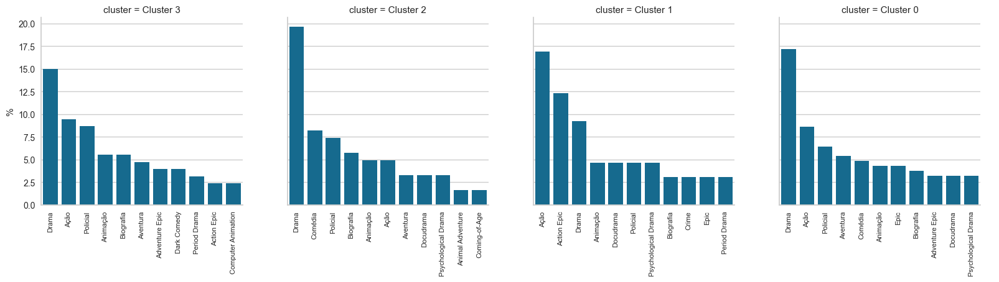

In [ ]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

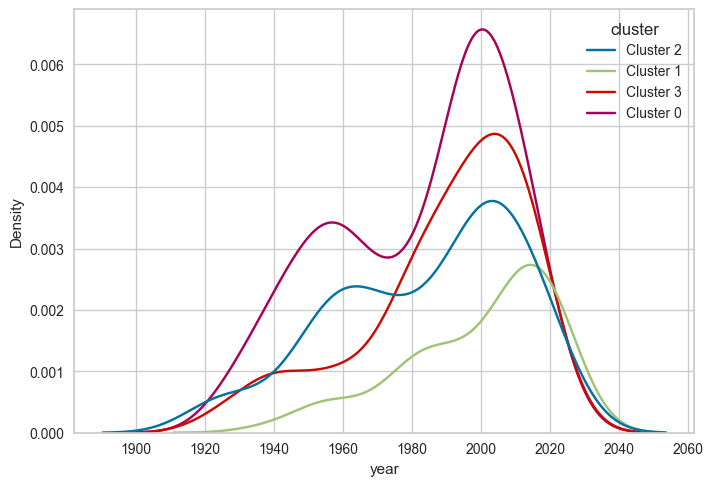

In [ ]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

In [ ]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,Cluster 0,Cluster 1,Cluster 2,Cluster 3
0,Action Epic,0.000000,12.307692,0.000000,2.362205
1,Adventure Epic,3.225806,0.000000,0.000000,3.937008
2,Animal Adventure,0.000000,0.000000,1.639344,0.000000
3,Animação,4.301075,4.615385,4.918033,5.511811
4,Aventura,5.376344,0.000000,3.278689,4.724409
5,Ação,8.602151,16.923077,4.918033,9.448819
6,Biografia,3.763441,3.076923,5.737705,5.511811
7,Coming-of-Age,0.000000,0.000000,1.639344,0.000000
8,Computer Animation,0.000000,0.000000,0.000000,2.362205
9,Comédia,4.838710,0.000000,8.196721,0.000000


In [ ]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Action Epic,Cluster 0,0.000000
1,Adventure Epic,Cluster 0,3.225806
2,Animal Adventure,Cluster 0,0.000000
3,Animação,Cluster 0,4.301075
4,Aventura,Cluster 0,5.376344


In [ ]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

Cluster 2


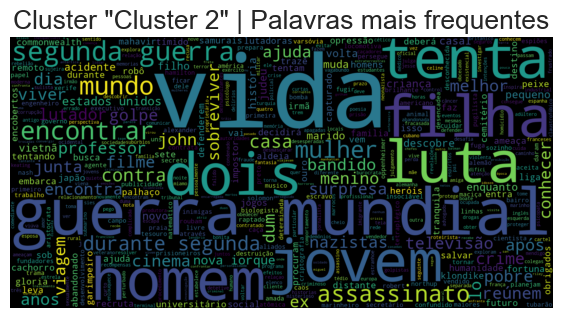

Cluster 1


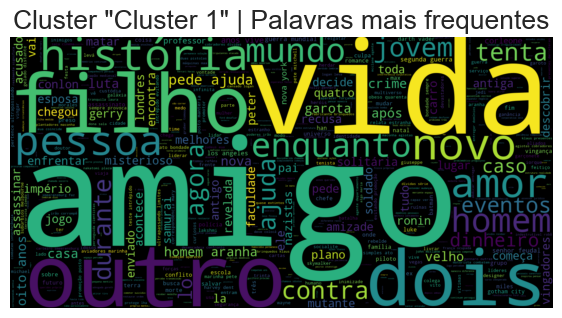

Cluster 3


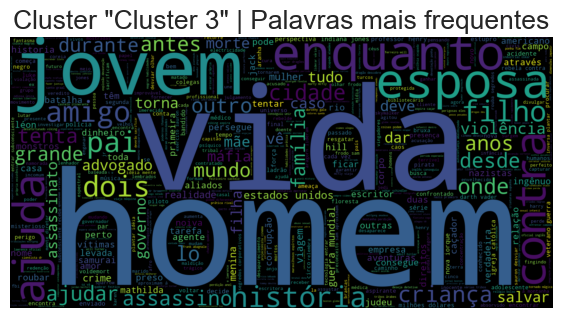

Cluster 0


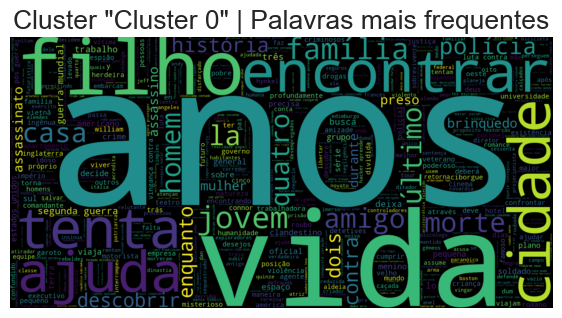

In [ ]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

list_clusters = df_processed.cluster.unique().tolist()
for c in list_clusters:
  print(c)
  word_cloud_cluster(c)

O cluster 0 apresentou um número muito maior número de filmes que os outros clusters, provavelmente devido a relação de um número baixo de clusters e também um número baixo informações divergêntes entre os filmes (poucos genêros e etc) (Idealmente os cluster devem conter quantidades balanceadas, porém neste projeto, por ter um dataset com baixo número de amostras (275), não foi possível atender esta premissa).

*O genêro dominante foi o "Drama", ele está presente como o principal genêro em todos os clusters exceto o 4, onde ele perde para o genêro de animação para fica em 2º lugar

TOP RANKING DOS CLUSTERS:
0. DRAMA - AÇÃO
1. DRAMA - BIOGRAFIA
2. DRAMA - AÇÃO
3. DRAMA - AÇÃO
4. ANIMAÇÃO - DRAMA

Avaliando a distribuição dos anos de lançamento dos filmes por cluster, existe uma maior concentração ao redor dos anos 2000 em todos os clusters. O cluster 1 teve um número maior de filmes lançados aproximadamente nos anos 50 que os outros clusters (exceto ao 0 devido a quantidade de filmes, mas em proporções iguais, o cluster 1 teria mais). Pode exister uma relação de idade de lançamento nos clusters.

Depois foi apresentado um gráfico de radar por cluster, nele podemos ver e entender a divisão de cluster por genêros e como os genêros dos glusters se complementam, por exemplo "drama - comédia - ação" no cluster 2 e "drama - animação - ação" no cluster 4

TOP PALAVRAS RELEVANTES NA NUVEM DE PALAVRA DE CADA CLUSTER:
0. Guerra Mundial, Nazista, História, Contra
1. Mutante, Máfia, Teatro, Viviver, Professor
2. Resgatar, Ajuda, Amigos, Guerra, vingadores
3. Assasino, Piloto, Preso, Americano, Estados Unidos
4. Jovem, Robô, futuro, Velho, Amaldiçoada


MODELO 2:

O modelo 2 equilibrou a quantidade de filmes por cluster melhor que o modelo 1, porém a quantidade de filmes no primeiro cluster ainda é um pouco superior em relação aos outros, a melhor distribuição dos filmes acontece pois como passamos todas as informações do dataframe como feature, ele consegue reconhecer mais divisões de padrões. 

*O genêro dominante foi o "Drama" novamente foi o drama, mas dessa vez ele divide holofotes com o genêro de ação. Um ponto legal é que o clusters 0 e 3 tem uma grande semelhança entre os gêneros, o que indica que uma outra feature foi predominante para realizar a divisão dos clusters

TOP RANKING DOS CLUSTERS:
0. DRAMA - AÇÃO
1. DRAMA - AÇÃO ÉPICA [ACTI ON EPIC]
2. DRAMA - COMÉDIA
3. DRAMA - AÇÃO


Outro ponto que auxiliou a criação dos clusters de maneira equilibrada foi a remoção da feature de ano de lançamento, pois como já testamos em aula anteriormente, é uma informação muito forte e que acabava cortando os clusters pela epóca de lançamento, e não pela proximidade de conteúdo.


TOP PALAVRAS RELEVANTES NA NUVEM DE PALAVRA DE CADA CLUSTER:
0. VIDA, AJUDA, FAMILIA, FILHO e ENCONTRAR
1. HOMEM, ESPOSA, JOVEM e ASSASINO
2. GUERRA MUNDIAL, LUTA, HOMEM, MUNDO
3. VIDA, HOMEM, ESPOSA, VIOLÊNCIA

COMPARATIVO: